# Linear Discriminant Analysis - Demonstration
## With dimensionality reduction

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score
from LinearDiscriminantAnalysis import LinearDiscriminantAnalysis

In [2]:
# Configuration:
np.set_printoptions(precision=4, suppress=True)
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
# Dataset:
mnist = fetch_openml('mnist_784', version=1, data_home='.', as_frame=True)
mnist.frame['target'] = mnist.target

In [4]:
# Function for displaying part of the dataset:
def print_mnist(X, y=None, title=None):
    fig = plt.figure(figsize=(8, 8))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)
    
    n_samples = X.shape[0]
    images = X.reshape(-1, 28, 28)
    for i in range(min(n_samples, 12 * 12)):
        ax = fig.add_subplot(12, 12, i + 1, xticks=[], yticks=[])
        ax.imshow(images[i], cmap=plt.cm.binary, interpolation='nearest')
        if y is not None:
            ax.text(0, 7, str(y[i]))
    
    fig.suptitle(title, y=1.08, fontsize=22)

In [5]:
X = mnist.data.to_numpy()
y = mnist.target.to_numpy()

X.shape, y.shape

((70000, 784), (70000,))

In [6]:
# Number of dimensions to preserve:

n_dimensions = 64

## PCA Transformation
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying PCA.

In [7]:
pca = PCA(random_state=42, n_components=n_dimensions)
X_pca = pca.fit_transform(X)

X_pca.shape

(70000, 64)

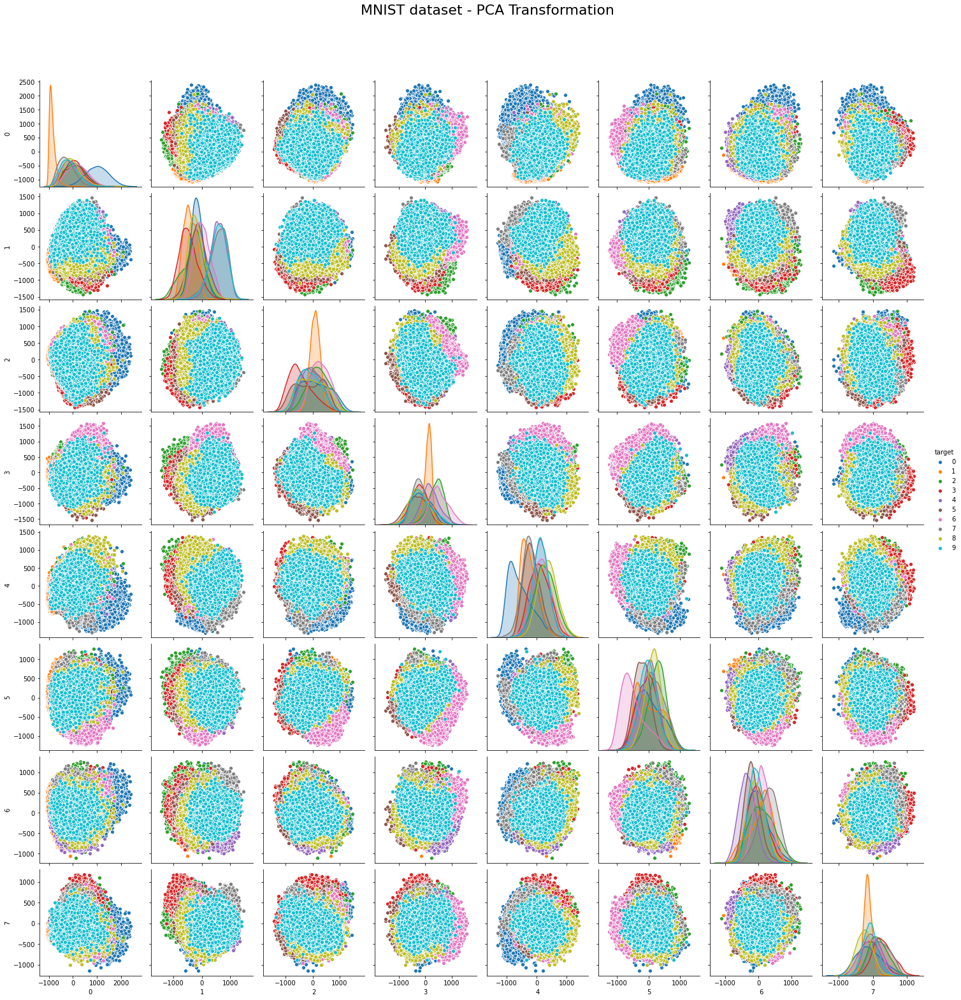

In [8]:
mnist_pca = pd.DataFrame.from_records(X_pca[:, :8])
mnist_pca['target'] = y
g = sns.pairplot(mnist_pca, hue="target")
g.fig.suptitle(f"MNIST dataset - PCA Transformation", y=1.08, fontsize=22);

In [9]:
X_pca_inv = pca.inverse_transform(X_pca)

X_pca_inv.shape

(70000, 784)

## LDA Transformation (without intra-class clustering)
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying LDA.

In [10]:
lda = LinearDiscriminantAnalysis(random_state=42, n_components=n_dimensions)
X_lda = lda.fit_transform(X, y, class_clustering=False, verbose=True)

X_lda.shape

Targets were provided: using the labeled data.

Mu:
[[  0.       0.       0.       0.       0.       0.       0.       0.
    0.       0.       0.       0.       0.0018   0.0067   0.0031   0.0001
    0.       0.       0.       0.       0.       0.       0.       0.
    0.       0.       0.       0.       0.       0.       0.       0.
    0.0002   0.0013   0.0113   0.0231   0.0432   0.0622   0.1179   0.1712
    0.1934   0.1901   0.2063   0.1827   0.1701   0.1445   0.0992   0.0682
    0.0489   0.0183   0.0086   0.003    0.       0.       0.       0.
    0.       0.       0.0009   0.0006   0.006    0.0109   0.0563   0.1394
    0.2682   0.521    0.9166   1.4125   2.0055   2.6448   3.2949   3.6582
    3.6887   3.3026   2.7046   1.9718   1.1747   0.608    0.2864   0.0918
    0.0303   0.0074   0.       0.       0.       0.       0.0028   0.005
    0.0132   0.0703   0.2188   0.5492   1.1733   2.2705   3.782    5.6468
    7.6889   9.9488  11.987   13.2303  12.9729  11.5404   9.3011   6.6749
   

Mu_c[1]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.0396   0.0645   0.009    0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.0109   0.0507   0.1085   0.2062   0.2912   0.3518
   0.2078   0.0611   0.0229   0.0321   0.0076   0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.0053   0.0013
   0.       0.       0.       0.0037   0.0042   0.05     0.0966   0.2143
   0.4739   1.2345   1.7018   1.7856   1.446    1.2817   1.0042   0.742
   0.3958   0.2239   0.1108   0.0185   0.       0.       0.       0.
   0.     

Mu_c[5]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.0093   0.0784
   0.1281   0.1624   0.2078   0.2097   0.1331   0.0667   0.0404   0.0097
   0.       0.       0.       0.       0.       0.       0.       0.0006
   0.0312   0.0271   0.0404   0.0401   0.0279   0.1359   0.3282   0.4776
   0.8649   1.1815   1.863    2.496    2.6908   2.907    3.0664   3.012
   2.5506   2.0634   1.4157   0.7047   0.281    0.0534   0.0074   0.
   0. 

Mu_c[9]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.0032   0.0234   0.0039
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       

W:
[[ 0.      0.      0.     ...  0.0269 -0.0107  0.0234]
 [ 0.      0.      0.     ...  0.0915  0.0133 -0.0502]
 [ 0.      0.      0.     ...  0.0039  0.0627 -0.0297]
 ...
 [ 0.      0.      0.     ...  0.0295 -0.0307 -0.0143]
 [ 0.      0.      0.     ... -0.0107  0.0112  0.0008]
 [ 0.      0.      0.     ... -0.0066  0.0046  0.0198]]



(70000, 64)

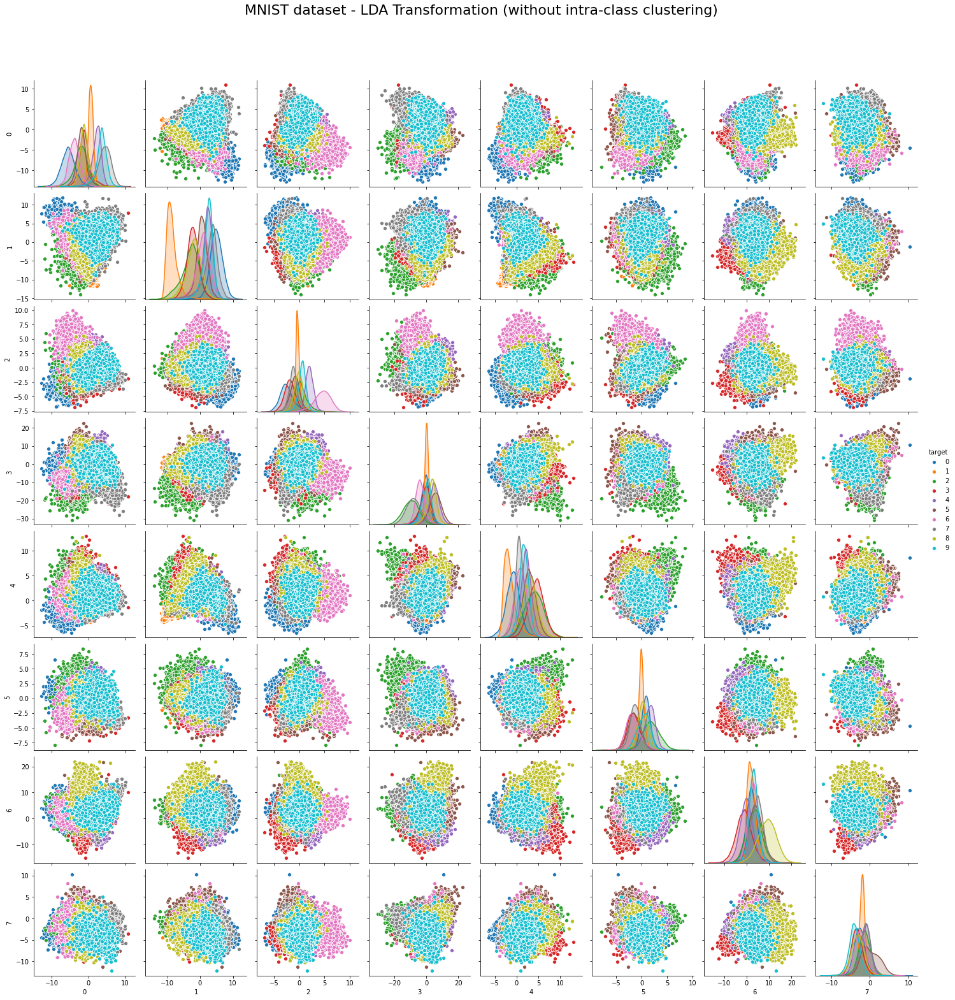

In [11]:
mnist_lda = pd.DataFrame.from_records(X_lda[:, :8])
mnist_lda['target'] = y
g = sns.pairplot(mnist_lda, hue="target")
g.fig.suptitle(f"MNIST dataset - LDA Transformation (without intra-class clustering)", y=1.08, fontsize=22);

In [12]:
X_lda_inv = lda.inverse_transform(X_lda, verbose=True)

X_lda_inv.shape

Reverse tranformation after dimensionality reduction may yield unexpected results: 64 dim. expanded to 784 dim.


(70000, 784)

## LDA Transformation (with intra-class clustering)
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying LDA.

In [13]:
ldacc = LinearDiscriminantAnalysis(random_state=42, n_components=n_dimensions)
X_ldacc = ldacc.fit_transform(X, y, min_clusters=1, max_clusters=5, class_clustering=True, verbose=True)

X_ldacc.shape

No target is provided: using unsupervised clustering.

Searching for an optimal number of clusters within class 0 for values between 1 and 5...

1 clusters: 	AIC: 60424075.200, 	BIC: 60429444.374  
2 clusters: 	AIC: 59692611.663, 	BIC: 59703356.849  
3 clusters: 	AIC: 59197424.911, 	BIC: 59213546.111  
4 clusters: 	AIC: 58903254.102, 	BIC: 58924751.315  
5 clusters: 	AIC: 58698874.360, 	BIC: 58725747.586  
Optimal number of clusters for class 0 found: 5

No target is provided: using unsupervised clustering.

Searching for an optimal number of clusters within class 1 for values between 1 and 5...

1 clusters: 	AIC: 64026275.682, 	BIC: 64031748.468  
2 clusters: 	AIC: 61938373.361, 	BIC: 61949325.905  
3 clusters: 	AIC: 60872344.098, 	BIC: 60888776.401  
4 clusters: 	AIC: 60230582.279, 	BIC: 60252494.339  
5 clusters: 	AIC: 59775902.725, 	BIC: 59803294.544  
Optimal number of clusters for class 1 found: 5

No target is provided: using unsupervised clustering.

Searching for an optimal nu


Mu_c[6]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.1334   0.4477   1.1008   1.8977
   1.6434   1.1223   0.6471   0.1082   0.       0.       0.       0.
   0.       0.      

Mu_c[17]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.0356   0.1628   0.1984   0.2841   0.2696
   0.3032   0.2927   0.1615   0.0501   0.0059   0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.0138   0.1002   0.323    1.0323   2.9532
   5.3797   7.9281  10.8471  13.2083  13.8833  13.586   10.8016   7.3718
   4.5656   1.7759   0.5214   0.0626   0.0316   0.       0.       0.
   0.       

Mu_c[33]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.0368   0.       0.       0.       0.0115
   0.1839   0.0296   0.0397   0.3172   1.5205   1.6402   0.8118   0.3764
   0.1053   0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.0094   0.       0.       0.       0.0353
   0.0382   0.0238   0.       0.0858   0.726    4.018   14.6864  33.1218
  47.9423  45.5155  27.287   10.0303   1.8104   0.6972   0.5559   0.0288
   0.       0.       0.       0.       0.       0.       0.       0.0728
   0.0634   0.       0.0094   0.1269   0.0844   0.2177   0.088    0.328
   3.0497  15.4542  49.4773  99.9964 134.2689 121.9027  72.5177  31.2747
   8.7195   2.1197   0.4427   0.0029   0.       0.       0.   

Mu_c[47]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.0166   0.1231   0.0204
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.      

S_intra:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

S_inter:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

Singular values:
Singular value 1: 	12.80%   	5.556444 	 Accepted
Singular value 2: 	10.68%   	4.635489 	 Accepted
Singular value 3: 	7.93%    	3.444602 	 Accepted
Singular value 4: 	7.25%    	3.147427 	 Accepted
Singular value 5: 	6.11%    	2.650920 	 Accepted
Singular value 6: 	5.45%    	2.364678 	 Accepted
Singular value 7: 	4.71%    	2.043824 	 Accepted
Singular value 8: 	4.19%    	1.818715 	 Accepted
Singular value 9: 	3.55%    	1.542249 	 Accepted
Singular value 10: 	3.11%    	1.347914 	 Accepted
Singular value 11: 	2.60%    	1.127897 	 Accepted
Singular value 12: 	2.36%    	1.025803 	 Accepted
Singular value 13: 	2.25%    	0.978698 	 Accepted
Singular v

W:
[[ 0.      0.      0.     ...  0.0269 -0.0107  0.0234]
 [ 0.      0.      0.     ...  0.0915  0.0133 -0.0502]
 [ 0.      0.      0.     ...  0.0039  0.0627 -0.0297]
 ...
 [ 0.      0.      0.     ...  0.0295 -0.0307 -0.0143]
 [ 0.      0.      0.     ... -0.0107  0.0112  0.0008]
 [ 0.      0.      0.     ... -0.0066  0.0046  0.0198]]



(70000, 64)

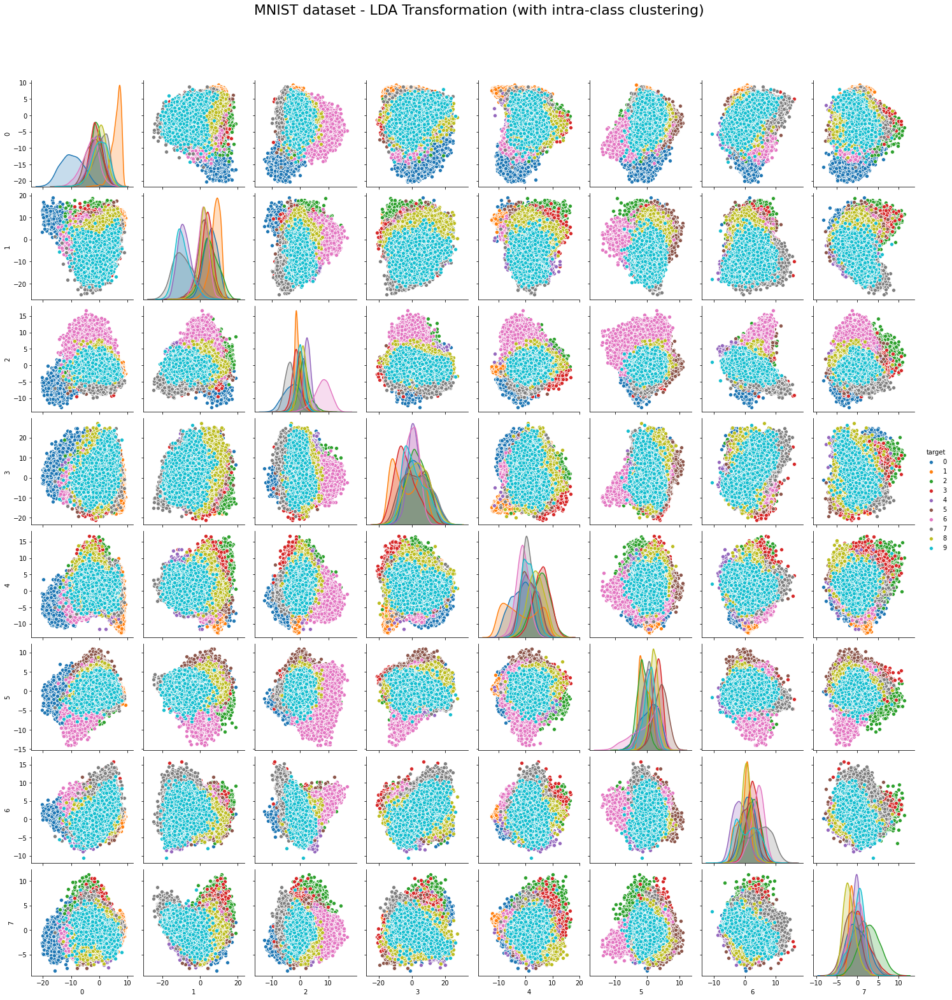

In [14]:
mnist_ldacc = pd.DataFrame.from_records(X_ldacc[:, :8])
mnist_ldacc['target'] = y
g = sns.pairplot(mnist_ldacc, hue="target")
g.fig.suptitle(f"MNIST dataset - LDA Transformation (with intra-class clustering)", y=1.08, fontsize=22);

In [15]:
X_ldacc_inv = ldacc.inverse_transform(X_ldacc, verbose=True)

X_ldacc_inv.shape

Reverse tranformation after dimensionality reduction may yield unexpected results: 64 dim. expanded to 784 dim.


(70000, 784)

## Unsupervised LDA Transformation
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying Unsupervised LDA.

In [16]:
ulda = LinearDiscriminantAnalysis(random_state=42, n_components=n_dimensions)
X_ulda = ulda.fit_transform(X, n_clusters=138, verbose=True)

X_ulda.shape

No target is provided: using unsupervised clustering.

Using the provided number of clusters (138) for unsupervised clustering.

138 clusters: 	AIC: 574775286.195, 	BIC: 575768437.220  
Mu:
[[  0.       0.       0.       0.       0.       0.       0.       0.
    0.       0.       0.       0.       0.0018   0.0067   0.0031   0.0001
    0.       0.       0.       0.       0.       0.       0.       0.
    0.       0.       0.       0.       0.       0.       0.       0.
    0.0002   0.0013   0.0113   0.0231   0.0432   0.0622   0.1179   0.1712
    0.1934   0.1901   0.2063   0.1827   0.1701   0.1445   0.0992   0.0682
    0.0489   0.0183   0.0086   0.003    0.       0.       0.       0.
    0.       0.       0.0009   0.0006   0.006    0.0109   0.0563   0.1394
    0.2682   0.521    0.9166   1.4125   2.0055   2.6448   3.2949   3.6582
    3.6887   3.3026   2.7046   1.9718   1.1747   0.608    0.2864   0.0918
    0.0303   0.0074   0.       0.       0.       0.       0.0028   0.005
    0.0132   

Mu_c[21]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.0888   0.448    0.5709   0.6465   0.2306   0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0. 

Mu_c[43]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.3127   0.3674   0.5562   1.121    2.817    6.2622  10.9265
  14.0821  13.951   10.8343   6.2896   3.4352   1.3156   0.2565   0.0605
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.  

Mu_c[65]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.0505   0.3661   0.9144   1.7363   2.9972   3.7265   2.8247   1.1276
   0.7742   0.8429   0.2763   0.       0.       0.       0.       0.
   0.       0.      

Mu_c[89]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0. 

Mu_c[112]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.

Mu_c[134]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.047    0.2809   0.802    0.9777   0.3762
   0.005    0.2661   0.0891   0.2884   0.1485   0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.0099   0.2129   0.2153   0.1597   0.1163   0.453    0.7191   1.4678
   2.1609   3.3205   5.2351   5.8082   4.1559   3.1609   3.5173   2.6522
   1.6634   0.5928   0.2686   0.099    0.       0.       0.       0.
   0.      

S_intra:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

S_inter:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

Singular values:
Singular value 1: 	10.79%   	7.765376 	 Accepted
Singular value 2: 	8.98%    	6.464535 	 Accepted
Singular value 3: 	6.54%    	4.706317 	 Accepted
Singular value 4: 	6.22%    	4.479599 	 Accepted
Singular value 5: 	4.99%    	3.590928 	 Accepted
Singular value 6: 	4.72%    	3.399466 	 Accepted
Singular value 7: 	4.12%    	2.964231 	 Accepted
Singular value 8: 	3.38%    	2.429829 	 Accepted
Singular value 9: 	3.07%    	2.212463 	 Accepted
Singular value 10: 	2.65%    	1.909938 	 Accepted
Singular value 11: 	2.26%    	1.625915 	 Accepted
Singular value 12: 	2.10%    	1.510875 	 Accepted
Singular value 13: 	2.04%    	1.466303 	 Accepted
Singular v

W:
[[ 0.      0.      0.     ...  0.0269 -0.0107  0.0234]
 [ 0.      0.      0.     ...  0.0915  0.0133 -0.0502]
 [ 0.      0.      0.     ...  0.0039  0.0627 -0.0297]
 ...
 [ 0.      0.      0.     ...  0.0295 -0.0307 -0.0143]
 [ 0.      0.      0.     ... -0.0107  0.0112  0.0008]
 [ 0.      0.      0.     ... -0.0066  0.0046  0.0198]]



(70000, 64)

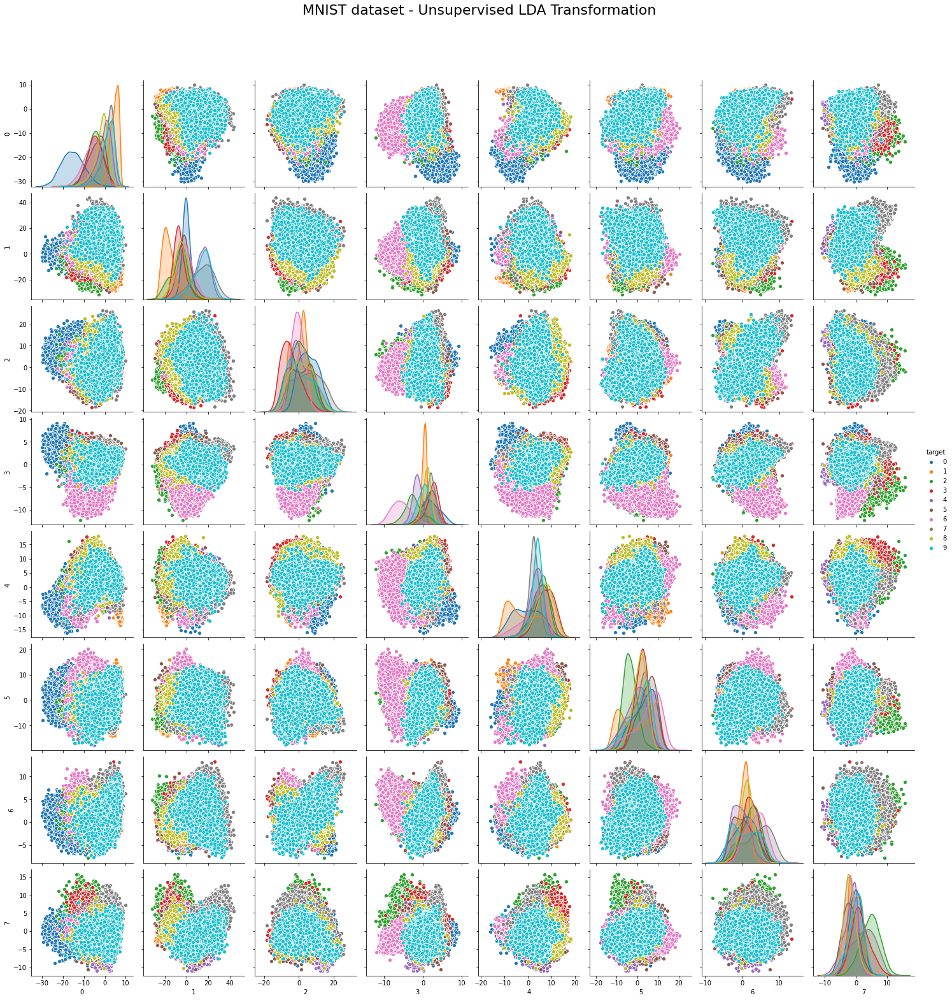

In [17]:
mnist_ulda = pd.DataFrame.from_records(X_ulda[:, :8])
mnist_ulda['target'] = y
g = sns.pairplot(mnist_ulda, hue="target")
g.fig.suptitle(f"MNIST dataset - Unsupervised LDA Transformation", y=1.08, fontsize=22);

In [18]:
X_ulda_inv = ulda.inverse_transform(X_ulda, verbose=True)

X_ulda_inv.shape

Reverse tranformation after dimensionality reduction may yield unexpected results: 64 dim. expanded to 784 dim.


(70000, 784)

## Comparison of the inverse transformation

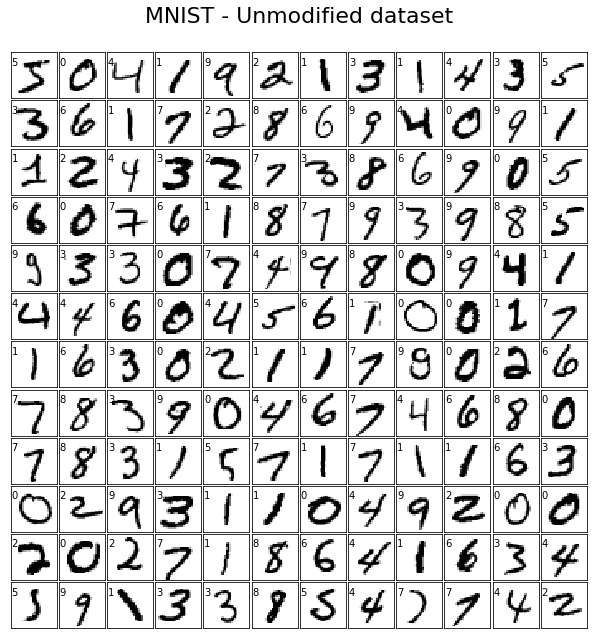

In [19]:
print_mnist(X, y, title="MNIST - Unmodified dataset")

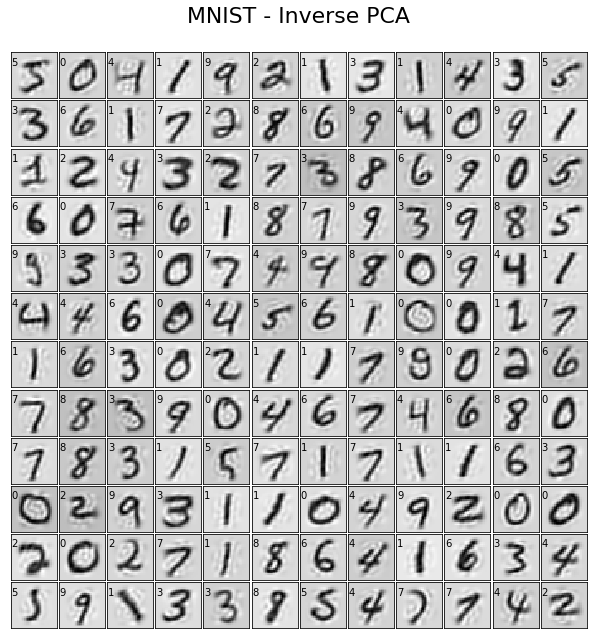

In [20]:
print_mnist(X_pca_inv, y, title="MNIST - Inverse PCA")

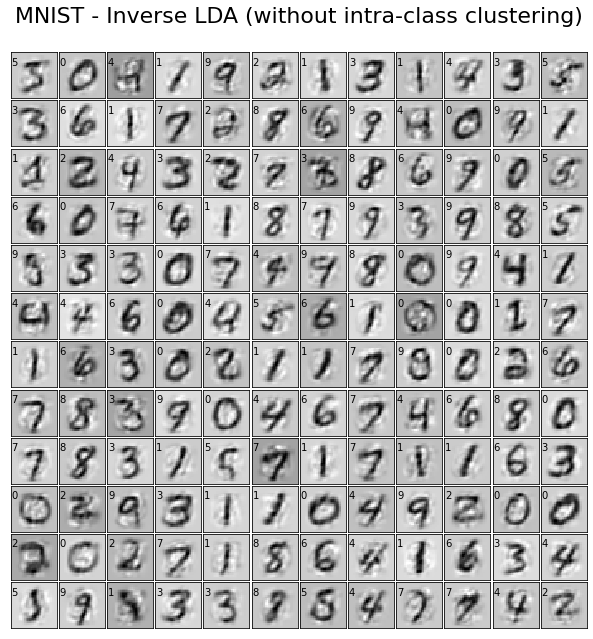

In [21]:
print_mnist(X_lda_inv, y, title="MNIST - Inverse LDA (without intra-class clustering)")

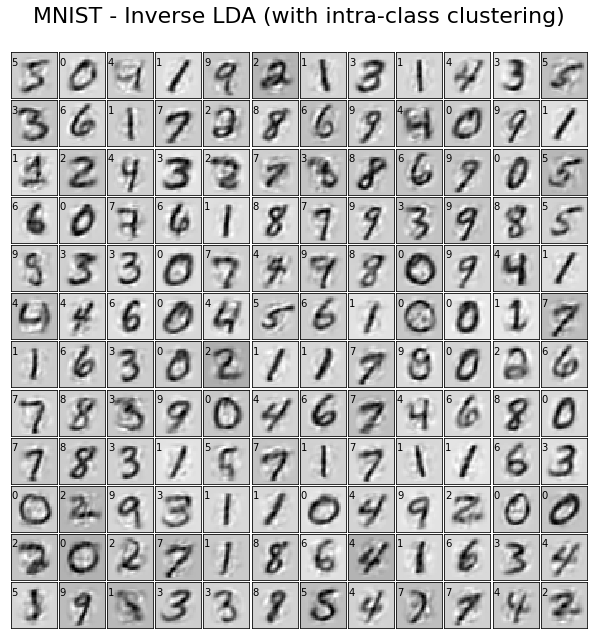

In [22]:
print_mnist(X_ldacc_inv, y, title="MNIST - Inverse LDA (with intra-class clustering)")

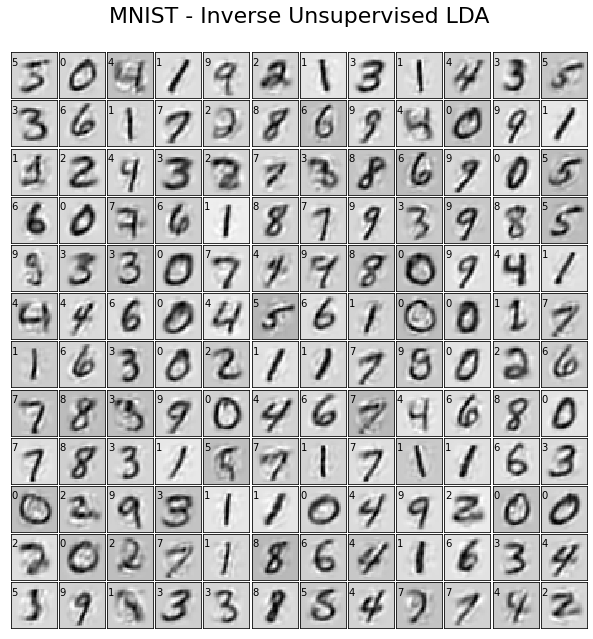

In [23]:
print_mnist(X_ulda_inv, y, title="MNIST - Inverse Unsupervised LDA")

## Comparison on different classifiers

In [24]:
gnb = GaussianNB()
res_original = np.mean(cross_val_score(gnb, X, y, cv=5, scoring='accuracy'))
res_pca = np.mean(cross_val_score(gnb, X_pca, y, cv=5, scoring='accuracy'))
res_lda = np.mean(cross_val_score(gnb, X_lda, y, cv=5, scoring='accuracy'))
res_ldacc = np.mean(cross_val_score(gnb, X_ldacc, y, cv=5, scoring='accuracy'))
res_ulda = np.mean(cross_val_score(gnb, X_ulda, y, cv=5, scoring='accuracy'))
print(f"Prediction score with Naive Bayes:\n"
      f" - Original dataset                       : {res_original:.2%}\n"
      f" - PCA transformation                     : {res_pca:.2%}\n"
      f" - LDA transformation (w/o clustering)    : {res_lda:.2%}\n"
      f" - LDA transformation (w/ clustering)     : {res_ldacc:.2%}\n"
      f" - Unsupervised LDA transformation        : {res_ulda:.2%}\n")

Prediction score with Naive Bayes:
 - Original dataset                       : 55.66%
 - PCA transformation                     : 87.33%
 - LDA transformation (w/o clustering)    : 86.55%
 - LDA transformation (w/ clustering)     : 86.38%
 - Unsupervised LDA transformation        : 86.08%



In [25]:
dtc = DecisionTreeClassifier(max_depth=9, random_state=42)
res_original = np.mean(cross_val_score(dtc, X, y, cv=5, scoring='accuracy'))
res_pca = np.mean(cross_val_score(dtc, X_pca, y, cv=5, scoring='accuracy'))
res_lda = np.mean(cross_val_score(dtc, X_lda, y, cv=5, scoring='accuracy'))
res_ldacc = np.mean(cross_val_score(dtc, X_ldacc, y, cv=5, scoring='accuracy'))
res_ulda = np.mean(cross_val_score(dtc, X_ulda, y, cv=5, scoring='accuracy'))
print(f"Prediction score with a Decision Tree Classifier:\n"
      f" - Original dataset                       : {res_original:.2%}\n"
      f" - PCA transformation                     : {res_pca:.2%}\n"
      f" - LDA transformation (w/o clustering)    : {res_lda:.2%}\n"
      f" - LDA transformation (w/ clustering)     : {res_ldacc:.2%}\n"
      f" - Unsupervised LDA transformation        : {res_ulda:.2%}\n")

Prediction score with a Decision Tree Classifier:
 - Original dataset                       : 83.74%
 - PCA transformation                     : 76.25%
 - LDA transformation (w/o clustering)    : 84.40%
 - LDA transformation (w/ clustering)     : 81.77%
 - Unsupervised LDA transformation        : 79.23%



In [26]:
mlp = MLPClassifier(hidden_layer_sizes=(64, 32, 16), activation='tanh', max_iter=250, alpha=0.01, solver='sgd', 
                    verbose=False, random_state=42, learning_rate_init=.01, early_stopping=True)
res_original = np.mean(cross_val_score(mlp, X, y, cv=5, scoring='accuracy'))
res_pca = np.mean(cross_val_score(mlp, X_pca, y, cv=5, scoring='accuracy'))
res_lda = np.mean(cross_val_score(mlp, X_lda, y, cv=5, scoring='accuracy'))
res_ldacc = np.mean(cross_val_score(mlp, X_ldacc, y, cv=5, scoring='accuracy'))
res_ulda = np.mean(cross_val_score(mlp, X_ulda, y, cv=5, scoring='accuracy'))
print(f"Prediction score with a Multilayer Perceptron Classifier:\n"
      f" - Original dataset                       : {res_original:.2%}\n"
      f" - PCA transformation                     : {res_pca:.2%}\n"
      f" - LDA transformation (w/o clustering)    : {res_lda:.2%}\n"
      f" - LDA transformation (w/ clustering)     : {res_ldacc:.2%}\n"
      f" - Unsupervised LDA transformation        : {res_ulda:.2%}\n")

Prediction score with a Multilayer Perceptron Classifier:
 - Original dataset                       : 85.21%
 - PCA transformation                     : 93.36%
 - LDA transformation (w/o clustering)    : 89.34%
 - LDA transformation (w/ clustering)     : 79.29%
 - Unsupervised LDA transformation        : 94.95%



## Visualization of the centroids

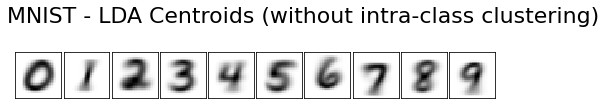

In [27]:
print_mnist(lda.mu_c_, title="MNIST - LDA Centroids (without intra-class clustering)")

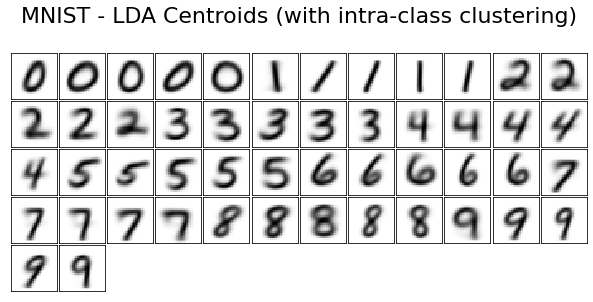

In [28]:
print_mnist(ldacc.mu_c_, title="MNIST - LDA Centroids (with intra-class clustering)")

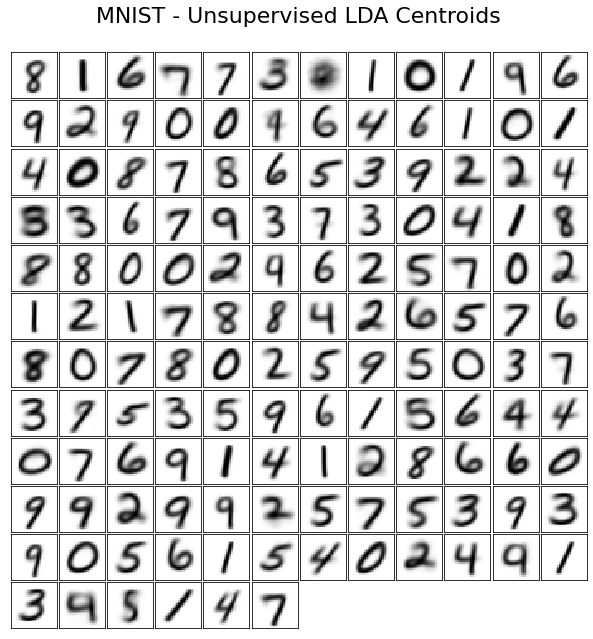

In [29]:
print_mnist(ulda.mu_c_, title="MNIST - Unsupervised LDA Centroids")